In [1]:
import torch
import torch.nn as nn
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os

In [2]:
data_path = 'Cat/'

In [3]:
if torch.cuda.is_available():
    device = 'cuda:0'
    print('Running on GPU')
else:
    device = 'cpu'
    print('Running on CPU')

Running on GPU


# Show Images

In [4]:
from torchvision.utils import make_grid

def show_tensor_images(image_tensor, num_images=25, size=(3, 64, 64)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

# Generator

Exact DCGAN paper implementation.

In [5]:
class Generator(nn.Module):
    def __init__(self, noise_chan=100, im_chan=3):
        super(Generator, self).__init__()
        
        self.noise_chan = noise_chan
        
        self.gen = nn.Sequential(
            self.intermediate_block(noise_chan, 64*16, kernel_size=4, stride=1),  # inp 1x1 kernel 4x4 op 4x4x1024  [output = (inp-1)*stride + kernel]
            self.intermediate_block(64*16, 64*8, kernel_size=2, stride=2),   # (4-1)*2 + 2 = 8x8x512 image
            self.intermediate_block(64*8, 64*4, kernel_size=2, stride=2),    # (8-1)*2 + 2 = 16x16x256 image
            self.intermediate_block(64*4, 64*2, kernel_size=2, stride=2),    # 32x32x128 output 
            self.final_block(64*2, im_chan, kernel_size=2, stride=2),        # 64x64x3 output
        )
        
    def intermediate_block(self, input_channels, output_channels, kernel_size, stride):
        return nn.Sequential(
            nn.ConvTranspose2d(input_channels, output_channels, kernel_size=kernel_size, stride=stride),
            nn.BatchNorm2d(output_channels),
            nn.ReLU(inplace=True)
        )
    
    def final_block(self, input_channels, output_channels, kernel_size, stride):
        return nn.Sequential(
            nn.ConvTranspose2d(input_channels, output_channels, kernel_size=kernel_size, stride=stride),
            nn.Tanh()
        )
    
    def forward(self, noise):
        noise = noise.view(len(noise), self.noise_chan, 1, 1)    # PyTorch takes (batch, channels, height, width)
        return self.gen(noise)
    

def get_noise(n_samples, noise_chan, device=device):
    return torch.randn(n_samples, noise_chan, device=device)

#### Testing Generator Output

'''
with torch.no_grad():
    gen = Generator().to(device)
    
    noise = get_noise(10, gen.noise_chan)
    noise = noise.view(len(noise), gen.noise_chan, 1, 1).to(device)
    
    block1 = gen.intermediate_block(gen.noise_chan, 64*16, 4, 1).to(device)
    b1_op = block1(noise)
    
    print(b1_op.shape)
    
    block2 = gen.intermediate_block(64*16, 64*8, 2, 2).to(device)
    b2_op = block2(b1_op)
    
    print(b2_op.shape)
    
    block3 = gen.intermediate_block(64*8, 64*4, 2, 2).to(device)
    b3_op = block3(b2_op)
    
    print(b3_op.shape)
    
    block4 = gen.intermediate_block(64*4, 64*2, 2, 2).to(device)
    b4_op = block4(b3_op)
    
    print(b4_op.shape)
    
    block5 = gen.intermediate_block(64*2, 3, 2, 2).to(device)
    b5_op = block5(b4_op)
    
    print(b5_op.shape)
    
    gen_op = gen(noise)
    
    print('Final Shape:', gen_op.shape)
'''

# Discriminator

In [6]:
class Discriminator(nn.Module):
    def __init__(self, im_chan=3):
        super(Discriminator, self).__init__()
        
        self.disc = nn.Sequential(
            self.intermediate_block(im_chan, 16, kernel_size=4, stride=2),
            self.intermediate_block(16, 16*2, kernel_size=4, stride=2),
            self.intermediate_block(16*2, 16*4, kernel_size=4, stride=2),
            self.final_block(16*4, 1, kernel_size=4, stride=2),
        )
        
    def intermediate_block(self, input_channels, output_channels, kernel_size, stride):
        return nn.Sequential(
            nn.Conv2d(input_channels, output_channels, kernel_size=kernel_size, stride=stride),
            nn.BatchNorm2d(output_channels),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )
    
    def final_block(self, input_channels, output_channels, kernel_size, stride):
        return nn.Sequential(
            nn.Conv2d(input_channels, output_channels, kernel_size=kernel_size, stride=stride),
        )
    
    def forward(self, img):
        return self.disc(img)

# Data Reading

In [7]:
SAVED = True

if not SAVED:
    cats = []

    for img_file in os.listdir(data_path):
        try:
            img = cv2.imread(os.path.join(data_path, img_file))
            img = cv2.resize(img, (64, 64))
            img = np.transpose(img, (2, 0, 1))
            cats.append(img)
        except:
            continue
            
    cats = torch.as_tensor(cats)   # for numpy ndarrays, you can use torch.from_numpy(...)  NEVER use torch.Tensor(...)
    np.save('cats.npy', cats)

else:
    cats = np.load('cats.npy')
    cats = torch.as_tensor(cats)

In [8]:
cats.shape

torch.Size([12476, 3, 64, 64])

In [9]:
print(cats[0].transpose(0, 1).transpose(1, 2).shape)
print(cats[0].permute(1, 2, 0).shape)   # same as np.transpose(1, 2, 0)

# The above 2 are same

torch.Size([64, 64, 3])
torch.Size([64, 64, 3])


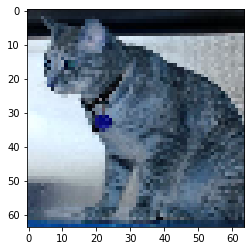

In [10]:
plt.imshow(cats[0].permute(1, 2, 0))

In [11]:
cats = cats/255.

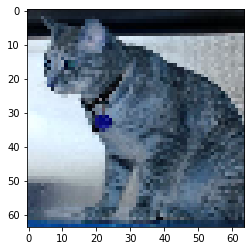

In [12]:
plt.imshow(cats[0].permute(1, 2, 0))

# Training

In [13]:
criterion = nn.BCEWithLogitsLoss()
beta_1 = 0.5
beta_2 = 0.999
lr = 2e-4
batch_size = 32

In [14]:
gen = Generator(noise_chan=100).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr, betas=(beta_1, beta_2))

In [15]:
# You initialize the weights to the normal distribution
# with mean 0 and standard deviation 0.02
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, mean=0.0, std=0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, mean=0.0, std=0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 750: Generator loss: 0.721597125848134, discriminator loss: 0.6728219114144636


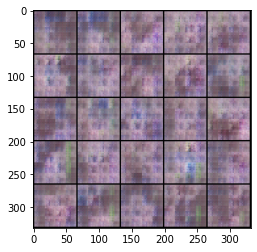

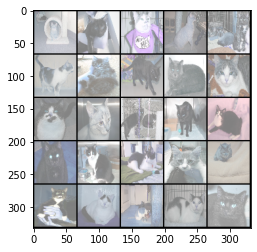

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 1500: Generator loss: 0.6962433176040648, discriminator loss: 0.6953014574050905


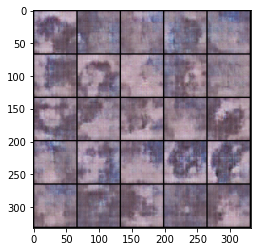

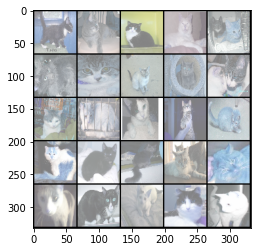

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 2250: Generator loss: 0.6953825421333308, discriminator loss: 0.6943940604527787


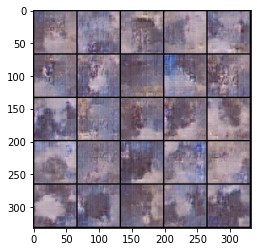

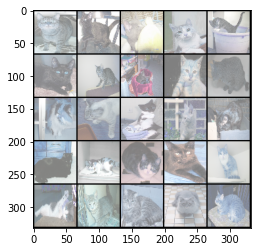

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 3000: Generator loss: 0.6950160672664648, discriminator loss: 0.6939650115172069


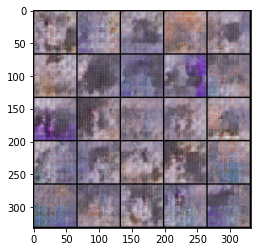

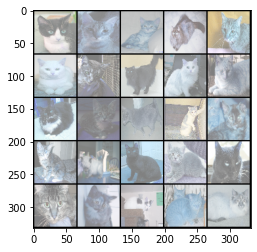

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 3750: Generator loss: 0.6937654634316764, discriminator loss: 0.6937967191537219


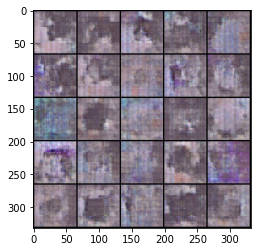

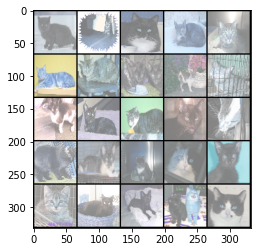

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 4500: Generator loss: 0.6942129271825159, discriminator loss: 0.6933729145526888


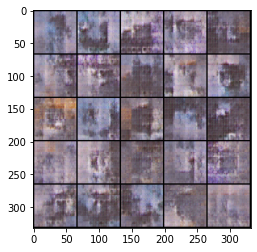

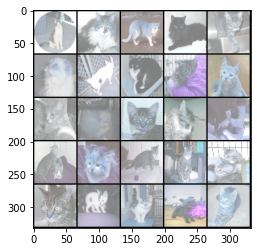

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 5250: Generator loss: 0.6939182014465328, discriminator loss: 0.6935013439655308


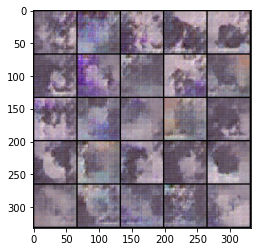

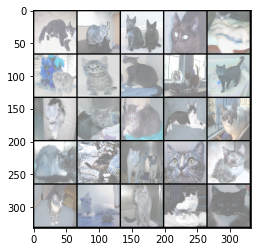

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 6000: Generator loss: 0.6939201309680936, discriminator loss: 0.693224318901698


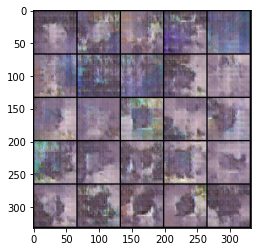

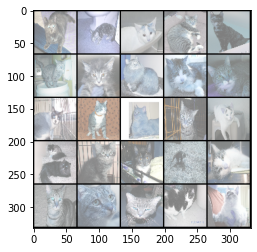

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 6750: Generator loss: 0.6940844718615213, discriminator loss: 0.6931742694377905


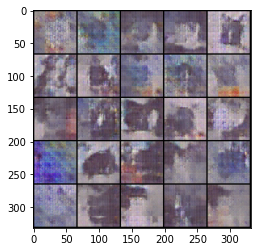

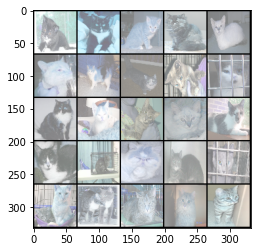

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 7500: Generator loss: 0.6940258226394658, discriminator loss: 0.6932207198143003


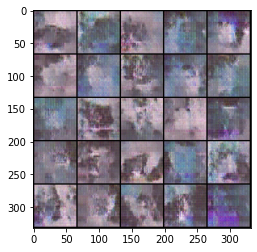

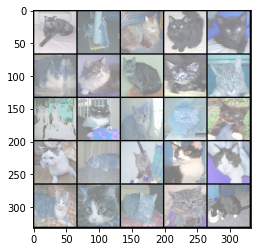

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 8250: Generator loss: 0.6939145139853158, discriminator loss: 0.6931273772716522


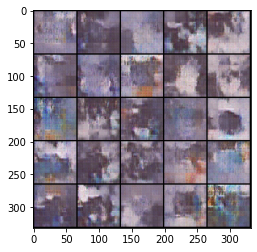

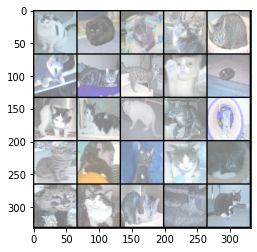

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 9000: Generator loss: 0.6942653396129602, discriminator loss: 0.6930031635761262


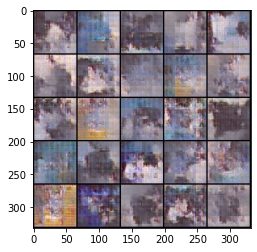

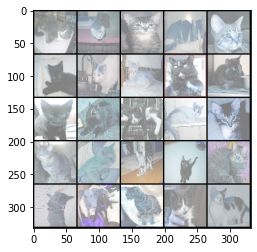

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 9750: Generator loss: 0.6952043723265323, discriminator loss: 0.6926100909709921


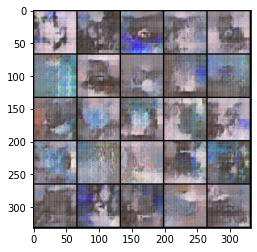

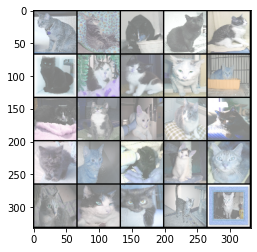

  0%|          | 0/390 [00:00<?, ?it/s]

Step 10500: Generator loss: 0.6973159318764998, discriminator loss: 0.6915722963809964


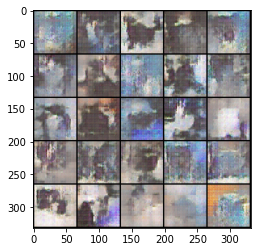

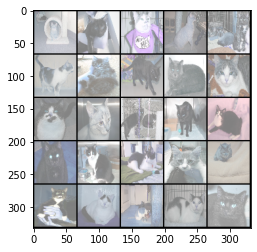

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 11250: Generator loss: 0.7030298287868494, discriminator loss: 0.6889712089697524


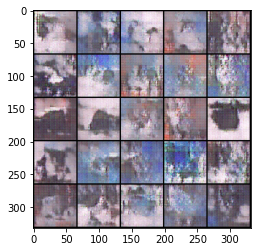

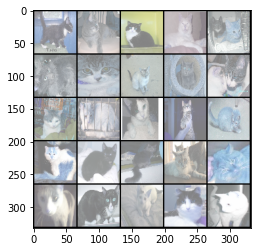

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 12000: Generator loss: 0.7127508427302036, discriminator loss: 0.6850440545876811


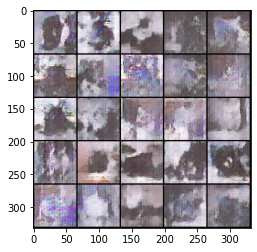

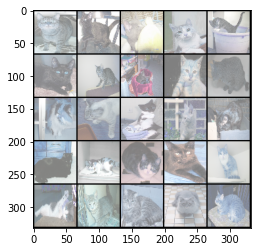

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 12750: Generator loss: 0.722190262715021, discriminator loss: 0.6810515197118124


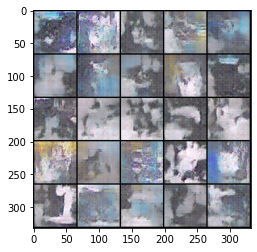

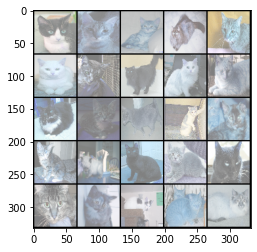

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 13500: Generator loss: 0.7226285316149392, discriminator loss: 0.6799174533685047


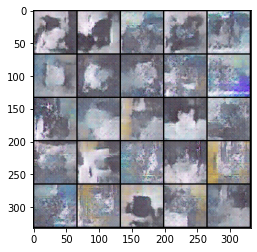

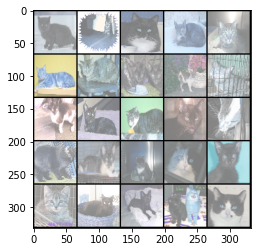

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 14250: Generator loss: 0.7273478846549993, discriminator loss: 0.6791609431107832


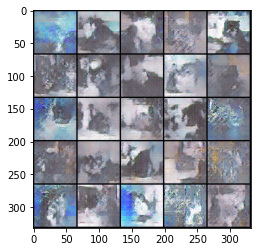

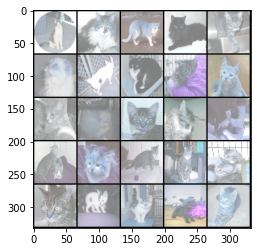

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 15000: Generator loss: 0.7278404378891, discriminator loss: 0.678409556468328


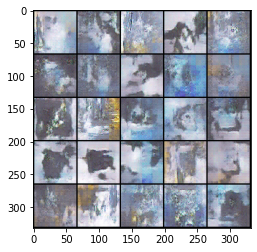

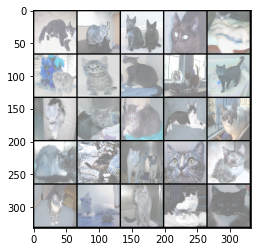

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 15750: Generator loss: 0.7302462755839024, discriminator loss: 0.6786093339125306


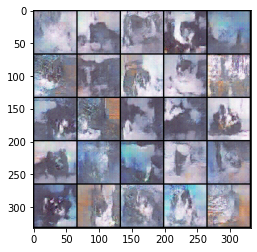

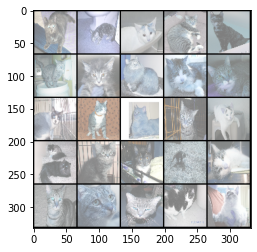

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 16500: Generator loss: 0.7303005005518604, discriminator loss: 0.6786608034769691


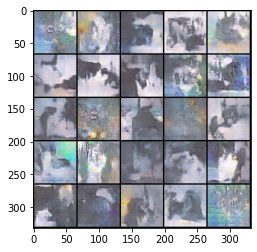

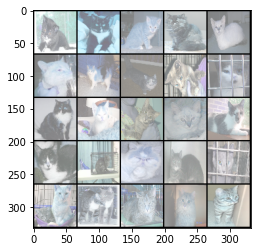

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 17250: Generator loss: 0.7298335383733109, discriminator loss: 0.678248919884363


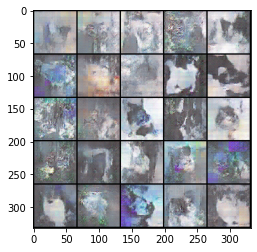

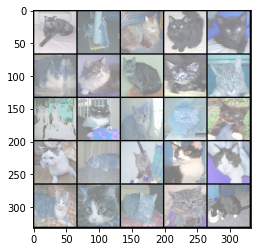

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 18000: Generator loss: 0.7352844021320337, discriminator loss: 0.6757676095962527


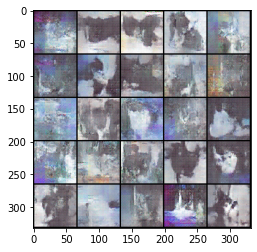

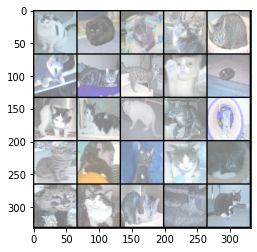

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 18750: Generator loss: 0.7602726967334754, discriminator loss: 0.6663836824099227


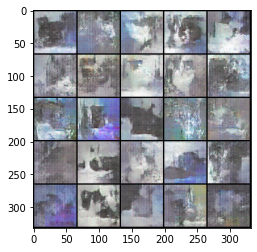

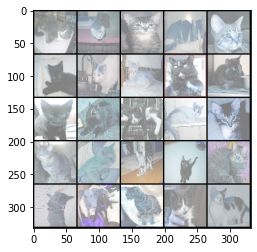

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 19500: Generator loss: 0.7665435371398915, discriminator loss: 0.664414600610733


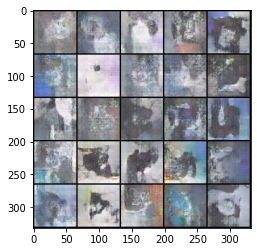

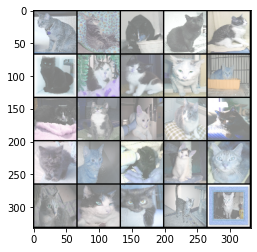

  0%|          | 0/390 [00:00<?, ?it/s]

Step 20250: Generator loss: 0.773893029054007, discriminator loss: 0.6613531336784372


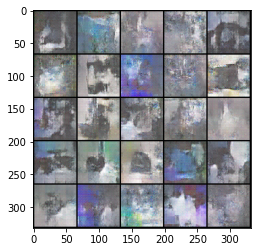

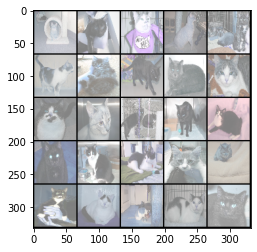

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 21000: Generator loss: 0.7748148980140679, discriminator loss: 0.6564582675298054


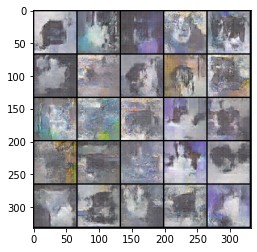

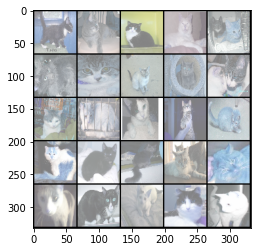

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 21750: Generator loss: 0.784963447332383, discriminator loss: 0.65284626452128


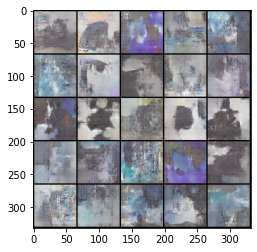

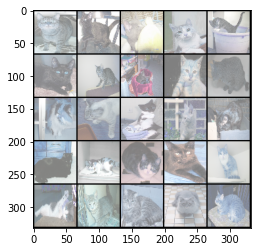

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 22500: Generator loss: 0.7924020849068963, discriminator loss: 0.6515259655316673


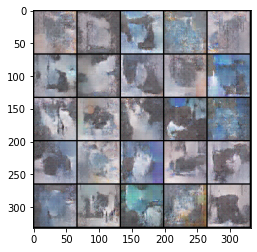

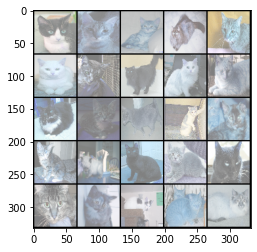

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 23250: Generator loss: 0.7920378367106117, discriminator loss: 0.652392570098241


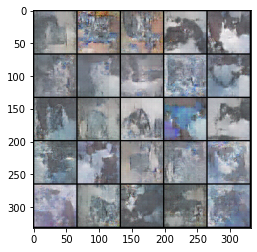

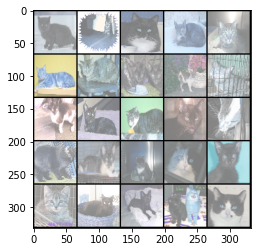

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 24000: Generator loss: 0.8029823418458306, discriminator loss: 0.6541863959630342


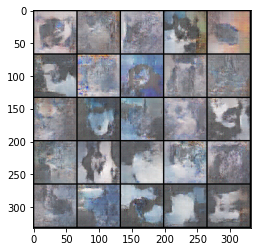

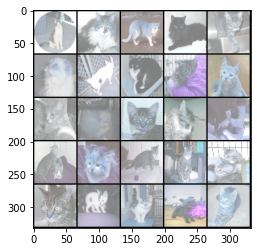

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 24750: Generator loss: 0.8021986691951757, discriminator loss: 0.653803063074748


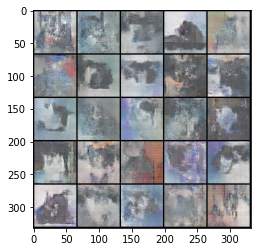

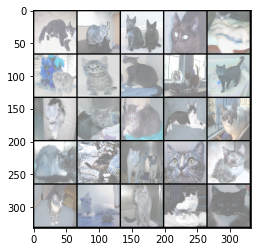

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 25500: Generator loss: 0.7965723848342894, discriminator loss: 0.657291079163552


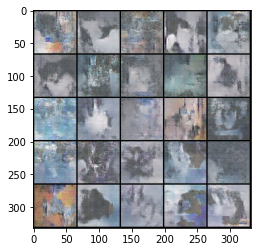

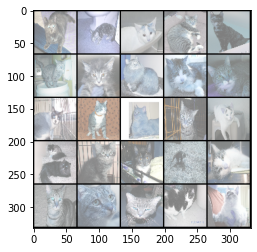

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 26250: Generator loss: 0.7974979637463891, discriminator loss: 0.6591365600426992


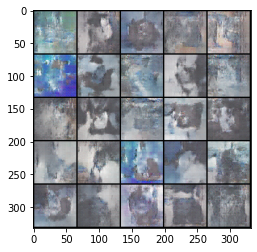

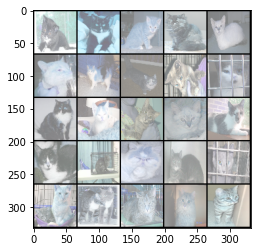

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 27000: Generator loss: 0.8047850808302559, discriminator loss: 0.6562469840844471


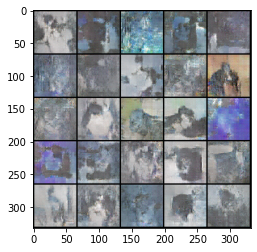

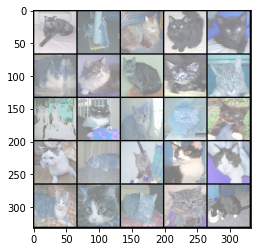

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 27750: Generator loss: 0.7988696842193601, discriminator loss: 0.6590751101573304


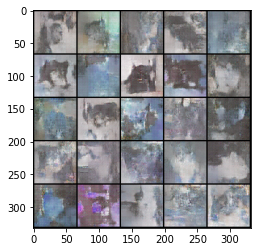

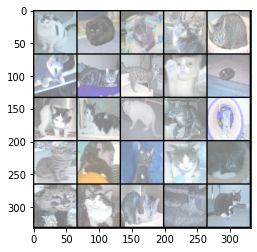

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 28500: Generator loss: 0.7997391587098445, discriminator loss: 0.657524125099182


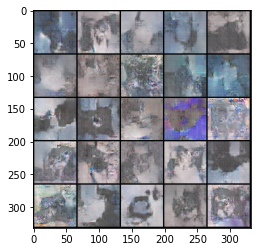

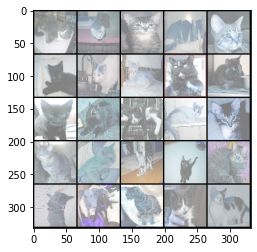

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 29250: Generator loss: 0.7978686115741737, discriminator loss: 0.6641849464972803


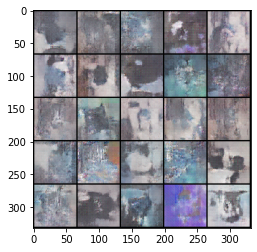

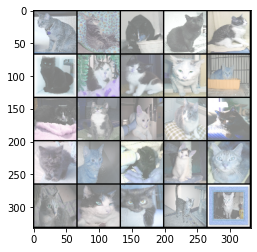

  0%|          | 0/390 [00:00<?, ?it/s]

Step 30000: Generator loss: 0.8060218191941573, discriminator loss: 0.660415702303251


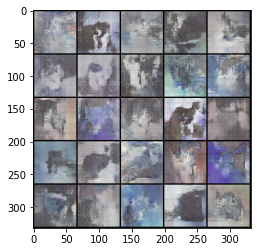

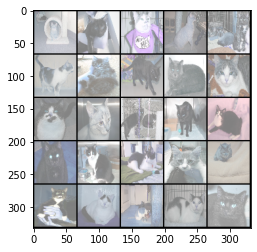

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 30750: Generator loss: 0.8052514414787298, discriminator loss: 0.6608572779893871


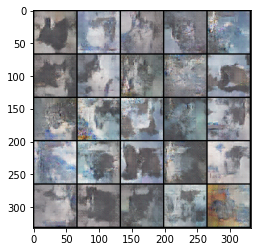

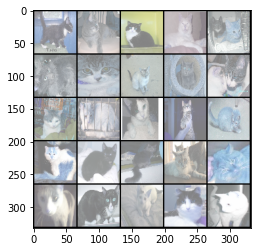

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 31500: Generator loss: 0.7949211150407798, discriminator loss: 0.6617458438475927


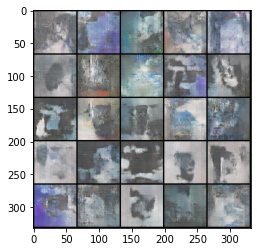

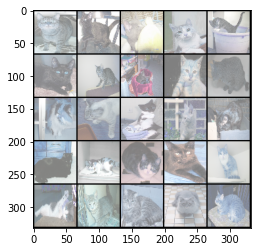

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 32250: Generator loss: 0.7930751651525486, discriminator loss: 0.6635267436901737


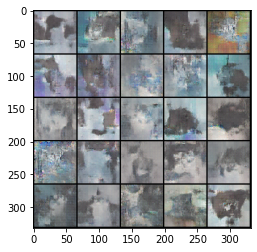

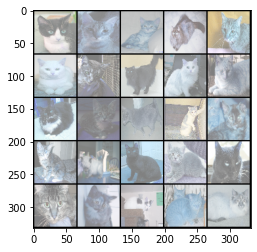

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 33000: Generator loss: 0.7910012183189395, discriminator loss: 0.6647259011665977


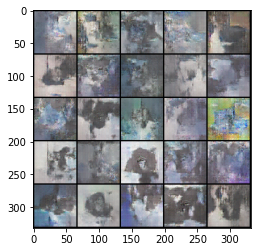

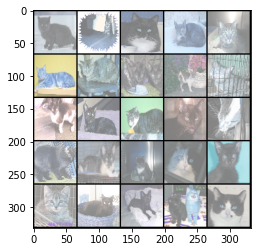

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 33750: Generator loss: 0.7882424355347949, discriminator loss: 0.6648803235292436


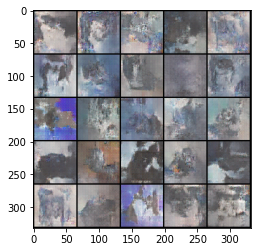

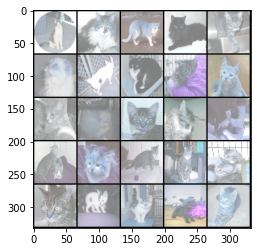

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 34500: Generator loss: 0.7885567574501043, discriminator loss: 0.6652069155375173


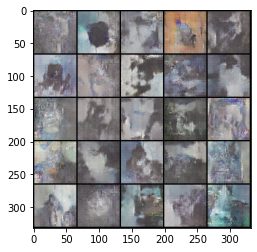

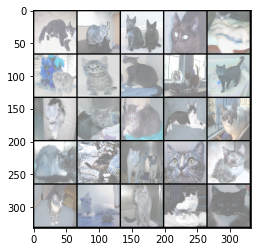

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 35250: Generator loss: 0.7887462133963903, discriminator loss: 0.6654613073269525


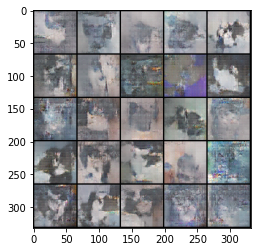

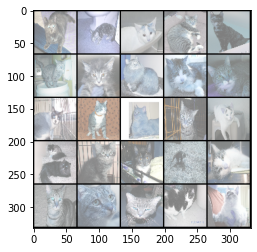

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 36000: Generator loss: 0.7876275819142659, discriminator loss: 0.6638185269435247


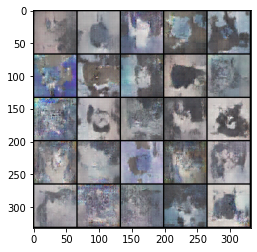

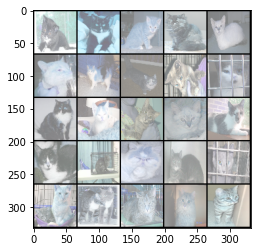

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 36750: Generator loss: 0.7843035018444066, discriminator loss: 0.6646813245614361


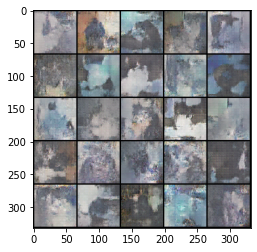

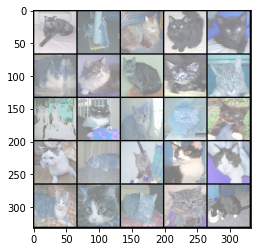

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 37500: Generator loss: 0.7835471490224198, discriminator loss: 0.6648926537036898


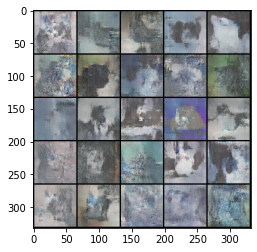

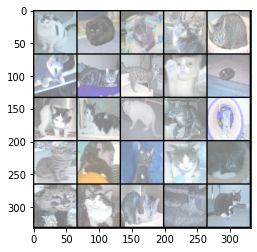

  0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/390 [00:00<?, ?it/s]

Step 38250: Generator loss: 0.7864733092387524, discriminator loss: 0.6652744601964945


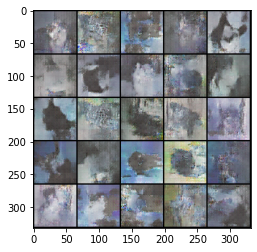

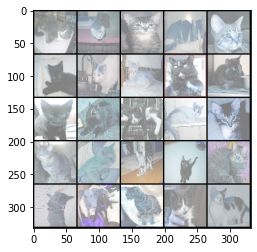

  0%|          | 0/390 [00:00<?, ?it/s]

In [16]:
epochs = 100
cur_step = 0
display_step = 750
mean_generator_loss = 0
mean_discriminator_loss = 0

for epoch in range(epochs):
    for bs in tqdm(range(0, len(cats), batch_size)):
        real_images = cats[bs:bs+batch_size].to(device)
        
        # UPDATE DISCRIMINATOR
        disc_opt.zero_grad()
        
        fake_noise = get_noise(len(real_images), 100, device=device)
        fake = gen(fake_noise)
        
        # detach fake outputs from generator graph
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        
        disc_real_pred = disc(real_images)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        
        disc_loss = (disc_fake_loss + disc_real_loss)/2
        
        # avg. loss until display_step
        mean_discriminator_loss += disc_loss.item()/display_step
        
        # update grads
        disc_loss.backward()
        # step towards minimum
        disc_opt.step()
        
        # UPDATE GENERATOR
        gen_opt.zero_grad()
        
        fake_noise_2 = get_noise(len(real_images), 100, device=device)
        fake_2 = gen(fake_noise_2)
        
        disc_fake_pred = disc(fake_2)
        
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        
        gen_loss.backward()
        gen_opt.step()
        
        mean_generator_loss += gen_loss.item()/display_step
        
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            show_tensor_images(fake)
            show_tensor_images(real_images)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1        

In [18]:
# torch.save(gen, 'generator.pth')

In [19]:
# torch.save(disc, 'discriminator.pth')